In [1]:
field = 'NW'
max_zoi = 100

In [18]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.path import Path

from astropy.io import fits
from scipy.ndimage import gaussian_filter1d, map_coordinates

from scipy import ndimage

from tqdm import tqdm

plt.rcParams.update({
    "font.family": "serif",
    "mathtext.fontset": "cm",
    "axes.linewidth": 1.5,
    "xtick.direction": "in",
    "ytick.direction": "in",
})

plt.rcParams["text.usetex"] = False

plt.rc('text', usetex=True)
plt.rc('font', family='serif', size=20)

#add rc param for ticks are inwards and minor ticks are on
plt.rc('xtick', direction='in', top=True)
plt.rc('ytick', direction='in', right=True)

FIELD = field
# FIELD: which map/cutout field to process; used to build input/output paths and region IDs.

# max_zoi: maximum Zone-of-Influence radius used to select the ZOI FITS map directory (in pc).

make_plots = False
# make_plots: if True, generates and saves per-region diagnostic plots (can be slow for many regions).

# ---------------------------
# Inputs
# ---------------------------

peak_csv = f"CATALOGS/final_peaks_{FIELD}.csv"
# peak_csv: CSV catalog listing region centers (x, y) to seed boundary finding.

halpha_fits = f'peak_files/data_for_visualisation_OIII+Ha_{FIELD}/M33_{FIELD}_HaOIII_amp_nonan.fits'
# halpha_fits: FITS image of the Halpha map used for boundary finding.

zoi_fits = f"ZOI_maps/ZOI_map_{max_zoi}pc/ZoI_map_{FIELD}.fits"
contzoi_fits = f"ZOI_maps/ZOI_map_{max_zoi}pc/ContZoI_map_{FIELD}.fits"
# zoi_fits: labeled ZOI map where each region is a positive integer label.

data, header_info = fits.getdata(halpha_fits, header=True)


# ---------------------------
# Outputs
# ---------------------------

BOUND_DIR = f"Boundary_maps/Boundary_map_{max_zoi}pc"
# BOUND_DIR: directory to write the boundary label FITS and summary tables.

os.makedirs(BOUND_DIR, exist_ok=True)

boundary_fits = f"{BOUND_DIR}/Boundary_map_{FIELD}.fits"
# boundary_fits: output FITS where each pixel contains the final region label (0 outside).

metrics_csv = f"{BOUND_DIR}/Boundary_metrics_{FIELD}.csv"
# metrics_csv: per-region table with background, radii percentiles, and other metrics.

plots_dir = "plots/boundary_plots/"
# plots_dir: directory to save diagnostic PNGs.

os.makedirs(plots_dir, exist_ok=True)

# ---------------------------
# Pixel-to-parsec conversion
# ---------------------------

PIXEL_SCALE_PC = None
# PIXEL_SCALE_PC: physical size of one pixel in parsecs (pc/px). Set this if you know it.

ASSUME_DISTANCE_MPC = 0.84
# ASSUME_DISTANCE_MPC: optional assumed distance to the target (Mpc) if you want to estimate pc/px from WCS.

# ---------------------------
# Per-azimuth (ray) boundary settings
# ---------------------------

N_THETA = 72
# N_THETA: number of angular rays sampled uniformly from 0..2pi per region.

R_BIN = 2.0
# R_BIN: radial sampling step along each ray, in pixels (smaller = finer but slower).

SMOOTH_SIGMA = 1.2
# SMOOTH_SIGMA: Gaussian sigma (in bins) used to smooth the 1D ray profile before edge detection.

EDGE_FRAC = 0.9999
# EDGE_FRAC: edge crossing threshold defined as bg + EDGE_FRAC * ray prominence (closer to 1 = further from peak).

FALLBACK_SIG_K = 10.0
# FALLBACK_SIG_K: fallback edge crossing threshold bg + k*sigma if prominence-based crossing fails.

RMAX_DEFAULT = max_zoi
# RMAX_DEFAULT: maximum search radius along rays (in pixels); typically tied to your ZOI choice.

# ---------------------------
# Local angular outlier suppression / smoothing
# ---------------------------

ANG_WIN_SECTORS = max(5, (N_THETA // 8) * 2 + 1)
# ANG_WIN_SECTORS: window size (in rays) to compute local median/MAD around each angle (kept odd-ish).

MAD_K_CLIP = 2.2
# MAD_K_CLIP: clip each r(theta) to local median ± k·MAD to suppress angular outliers.

SLOPE_ALPHA = 0.3
# SLOPE_ALPHA: slope cap strength; maximum step between neighboring rays is alpha * median(r).

SLOPE_MIN_PX = 4.0
# SLOPE_MIN_PX: minimum allowed slope cap in pixels (prevents over-tight smoothing on tiny regions).

SPIKE_K_NEIGH = 2.0
# SPIKE_K_NEIGH: neighbor-spike replacement threshold; replace r[i] if it exceeds neighbor mean + k·MAD.

SG_WINDOW = 7
# SG_WINDOW: Savitzky-Golay smoothing window (odd). Set to 0/None to disable.

SG_POLY = 2
# SG_POLY: polynomial order for Savitzky-Golay smoothing.

GLOBAL_P95_CAP = True
# GLOBAL_P95_CAP: if True, caps radii to the within-region 95th percentile after ZOI clamping to prevent extremes.

In [3]:
"""
Loads the Halpha map, the ZOI label map, and the region center catalog; also prepares an estimate of pc/px if requested.
"""
from astropy.wcs import WCS

def load_first_2d_image_from_fits(path):
    """Load the first HDU containing a 2D image; returns (data, header)."""
    with fits.open(path) as hdul:
        for h in hdul:
            if getattr(h, "data", None) is not None and getattr(h.data, "ndim", 0) == 2:
                data = h.data.astype(float)
                hdr = h.header
                return data, hdr
    raise RuntimeError(f"No 2D image found in: {path}")

def estimate_pc_per_pixel_from_wcs(header, distance_mpc):
    """
    Estimate pc/px from WCS angular scale and an assumed distance (Mpc).
    This is optional and can be wrong if headers are missing/odd; prefer setting PIXEL_SCALE_PC explicitly.
    """
    try:
        w = WCS(header)
        # proj_plane_pixel_scales gives degrees/pixel in each axis (requires astropy >= 3)
        from astropy.wcs.utils import proj_plane_pixel_scales
        scales_deg = proj_plane_pixel_scales(w)  # deg/px
        # Use mean angular scale
        deg_per_px = float(np.nanmean(scales_deg))
        if not np.isfinite(deg_per_px) or deg_per_px <= 0:
            return None

        # Convert angle to radians
        rad_per_px = deg_per_px * (np.pi / 180.0)

        # Small-angle: physical = D * theta
        # D in pc:
        d_pc = float(distance_mpc) * 1e6
        pc_per_px = d_pc * rad_per_px
        return pc_per_px
    except Exception:
        return None

# --- Load Halpa map ---
halpha, halpha_hdr = load_first_2d_image_from_fits(halpha_fits)
halpha = np.where(np.isfinite(halpha), halpha, np.nan)

# --- Load ZOI label map ---
zoi_label, _zoi_hdr = load_first_2d_image_from_fits(zoi_fits)
contzoi_label, _ = load_first_2d_image_from_fits(contzoi_fits)

if zoi_label.shape != halpha.shape:
    print(f"[warn] ZOI shape {zoi_label.shape} != Halpha shape {halpha.shape}. Proceeding assuming same pixel grid.")

# --- Load catalog ---
combined = pd.read_csv(peak_csv)

# Ensure required columns exist
required = {"x", "y"}
if not required.issubset(combined.columns):
    raise ValueError(f"{peak_csv} must contain columns: {required}")

combined = combined.copy()
combined["kind"] = combined.get("kind", "peak")
combined["field"] = FIELD

combined["x"] = pd.to_numeric(combined["x"], errors="coerce")
combined["y"] = pd.to_numeric(combined["y"], errors="coerce")
combined = combined.dropna(subset=["x", "y"]).reset_index(drop=True)

# Create a stable region_id even if CSV order changes
combined["region_id"] = [f"{FIELD}_{i+1:04d}" for i in range(len(combined))]

# Determine the ZOI integer label at each center (if any)
def label_at_xy(label_map, x, y):
    yi, xi = int(round(y)), int(round(x))
    if 0 <= yi < label_map.shape[0] and 0 <= xi < label_map.shape[1]:
        v = label_map[yi, xi]
        if np.isfinite(v) and v > 0:
            return int(round(v))
    return 0

combined["zoi_center_label"] = [label_at_xy(zoi_label, x, y) for x, y in zip(combined["x"], combined["y"])]

# Establish pc/px scale
if PIXEL_SCALE_PC is None:
    PIXEL_SCALE_PC = estimate_pc_per_pixel_from_wcs(halpha_hdr, ASSUME_DISTANCE_MPC)

if PIXEL_SCALE_PC is None:
    print("[info] PIXEL_SCALE_PC is not set and could not be estimated from WCS; pc values will be NaN.")
else:
    print(f"[info] Using PIXEL_SCALE_PC = {PIXEL_SCALE_PC:.4g} pc/px")

[info] Using PIXEL_SCALE_PC = 1.318 pc/px


In [4]:
"""
Helper functions: background estimation, ray sampling & edge finding, polygon rasterization,
and robust angular cleanup (MAD clipping, slope cap, spike replacement, optional SG smoothing).
"""
from astropy.stats import mad_std

def robust_bg_sigma_local(img, cx, cy, rmax, frac_in=0.7, frac_out=0.95):
    """
    Estimate local background and noise using an annulus between frac_in*rmax and frac_out*rmax.
    Returns (bg_median, sigma_MAD).
    """
    yy, xx = np.indices(img.shape)
    rr = np.hypot(xx - cx, yy - cy)

    rin, rout = frac_in * rmax, frac_out * rmax
    mask = (rr >= rin) & (rr < rout) & np.isfinite(img)
    vals = img[mask]

    bg = np.nanmedian(vals) if vals.size else 0.0
    sig = mad_std(vals - bg, ignore_nan=True) if vals.size else 0.0
    return float(bg), float(sig)

def sample_ray_profile(img, mask_in, cx, cy, theta, rmax, dr=1.0, smooth_sigma=1.2):
    """
    Sample an intensity profile along a ray at angle theta out to rmax.
    If mask_in is provided, clamp the ray to the last in-mask sample (ZOI rim),
    and return only the within-ZOI profile.
    """
    r = np.arange(0, rmax + dr, dr, dtype=float)
    ys = cy + r * np.sin(theta)
    xs = cx + r * np.cos(theta)

    prof = map_coordinates(img, [ys, xs], order=1, mode="nearest")
    prof = np.where(np.isfinite(prof), prof, np.nan)

    prof_s = gaussian_filter1d(
        prof, sigma=max(1e-6, smooth_sigma), mode="nearest", truncate=3.0
    )

    inmask = None
    if mask_in is not None:
        lab = map_coordinates(mask_in, [ys, xs], order=0, mode="nearest")
        inmask = np.isfinite(lab) & (lab > 0.5)

        # ---- ZOI CLAMP: keep only samples within the ZOI ----
        if inmask.any():
            last_idx = np.where(inmask)[0].max()
            r = r[: last_idx + 1]
            prof = prof[: last_idx + 1]
            prof_s = prof_s[: last_idx + 1]
            inmask = inmask[: last_idx + 1]
        else:
            # No ZOI hit on this ray; return empty-ish profile so edge finder can flag it
            r = r[:1]
            prof = prof[:1] * np.nan
            prof_s = prof_s[:1] * np.nan
            inmask = inmask[:1]

    return r, prof, prof_s, inmask

def find_edge_on_ray(r, prof_s, bg, sigma, inmask=None, edge_frac=0.5, fallback_sig_k=1.0):
    """
    Find an edge radius on a ray using:
      1) crossing at bg + edge_frac * prominence
      2) fallback crossing at bg + k*sigma
      3) first local minimum
      4) clamp to last in-mask radius (ZOI rim)
    Returns (radius, flag_string).
    """
    if not np.isfinite(prof_s).any():
        return np.nan, "RAY_EMPTY"
    
    if inmask is not None and inmask.any():
        last_idx = np.where(inmask)[0].max()
        r = r[: last_idx + 1]
        prof_s = prof_s[: last_idx + 1]
        inmask = inmask[: last_idx + 1]

    i_peak = int(np.nanargmax(prof_s))
    height = prof_s[i_peak]
    prom = height - bg
    lvl  = bg + edge_frac * max(prom, 0.0)
    start = min(len(r) - 2, i_peak + 1)

    # 1) prominence-based crossing
    for j in range(start, len(r) - 1):
        y0, y1 = prof_s[j], prof_s[j + 1]
        if np.isfinite([y0, y1]).all() and (y0 >= lvl) and (y1 <= lvl):
            t = 0.0 if (y1 == y0) else (lvl - y0) / (y1 - y0)
            return float(r[j] + t * (r[j + 1] - r[j])), "RAY_CROSS_FRAC_PROM"

    # 2) fallback crossing
    lvl2 = bg + fallback_sig_k * sigma
    for j in range(start, len(r) - 1):
        y0, y1 = prof_s[j], prof_s[j + 1]
        if np.isfinite([y0, y1]).all() and (y0 >= lvl2) and (y1 <= lvl2):
            t = 0.0 if (y1 == y0) else (lvl2 - y0) / (y1 - y0)
            return float(r[j] + t * (r[j + 1] - r[j])), "RAY_CROSS_BG_KSIG"

    # 3) first local minimum
    dy = np.diff(prof_s)
    for j in range(start, len(r) - 2):
        if np.isfinite([dy[j], dy[j + 1]]).all() and (dy[j] < 0) and (dy[j + 1] >= 0):
            return float(r[j + 1]), "RAY_LOCAL_MIN"

    # 4) clamp to ZOI rim
    if inmask is not None and inmask.any():
        last_idx = np.where(inmask)[0].max()
        return float(r[last_idx]), "RAY_CLAMP_TO_ZOI"

    return np.nan, "RAY_FAIL"

def polygon_from_polar(cx, cy, thetas, radii):
    """Convert polar boundary samples (thetas, radii) into polygon vertices (x,y)."""
    xs = cx + radii * np.cos(thetas)
    ys = cy + radii * np.sin(thetas)
    return np.vstack([xs, ys]).T

def rasterize_polygon_to_mask(shape, poly_xy):
    """Rasterize a polygon into a boolean mask with the same shape as the target image."""
    if len(poly_xy) < 3:
        return np.zeros(shape, dtype=bool)
    path = Path(poly_xy, closed=True)
    ys, xs = np.indices(shape)
    pts = np.vstack([xs.ravel(), ys.ravel()]).T
    inside = path.contains_points(pts, radius=0.0).reshape(shape)
    return inside

# --- Robust circular statistics and smoothing utilities ---

def circular_local_stats(vals, win):
    """Return local median and MAD for a periodic 1D array."""
    vals = np.asarray(vals, float)
    n = len(vals)
    pad = win // 2
    x = np.concatenate([vals[-pad:], vals, vals[:pad]])
    meds = np.empty(n)
    mads = np.empty(n)
    for i in range(n):
        w = x[i : i + win]
        m = np.nanmedian(w)
        meds[i] = m
        mads[i] = 1.4826 * np.nanmedian(np.abs(w - m))
    return meds, mads

def slope_cap(vals, L):
    """Enforce |r[i]-r[i-1]| <= L on a circular array via forward/backward passes."""
    r = np.array(vals, float).copy()
    n = len(r)

    # forward (upward spikes)
    for i in range(1, n):
        if r[i] > r[i - 1] + L:
            r[i] = r[i - 1] + L
    if r[0] > r[-1] + L:
        r[0] = r[-1] + L

    # backward (upward spikes)
    for i in range(n - 2, -1, -1):
        if r[i] > r[i + 1] + L:
            r[i] = r[i + 1] + L

    # forward (downward spikes)
    for i in range(1, n):
        if r[i] < r[i - 1] - L:
            r[i] = r[i - 1] - L
    if r[0] < r[-1] - L:
        r[0] = r[-1] - L

    # backward (downward spikes)
    for i in range(n - 2, -1, -1):
        if r[i] < r[i + 1] - L:
            r[i] = r[i + 1] - L

    return r

def neighbor_spike_replace(vals, local_mad, k=2.0):
    """Replace r[i] by neighbor-mean if r[i] > mean(neigh) + k*localMAD[i]."""
    r = np.array(vals, float).copy()
    n = len(r)
    for i in range(n):
        im = (i - 1) % n
        ip = (i + 1) % n
        neigh_mean = 0.5 * (r[im] + r[ip])
        if r[i] > neigh_mean + k * local_mad[i]:
            r[i] = neigh_mean
    return r

def tiny_sg(vals, win=7, poly=2):
    """Small Savitzky-Golay smoothing on a circular array (wrap mode); falls back to moving average."""
    if win is None or win < 3 or win % 2 == 0:
        return np.array(vals, float)

    try:
        from scipy.signal import savgol_filter
        return savgol_filter(np.array(vals, float), window_length=win, polyorder=poly, mode="wrap")
    except Exception:
        a = np.array(vals, float)
        pad = win // 2
        x = np.concatenate([a[-pad:], a, a[:pad]])
        kern = np.ones(win, float) / win
        sm = np.convolve(x, kern, mode="same")[pad:-pad]
        return sm

In [5]:
"""
Main boundary computation: loops over regions, estimates background, traces ray edges, cleans r(theta),
builds polygon masks, writes the boundary label map array, and stores per-region metrics including bg and ray percentiles.
"""

print(f"[CHECKPOINT] getting region domains, be patient....:)", flush=True)

boundary_label = np.zeros_like(zoi_label, dtype=np.float32)

metrics_rows = []
region_diagnostics = {}  # optional storage for plotting

for _, row in tqdm(combined.iterrows(), total=len(combined)):
    kind = str(row.get("kind", "peak"))
    cx = float(row["x"])
    cy = float(row["y"])
    rid = str(row["region_id"])
    region_label = int(row.get("zoi_center_label", 0))

    # Local cutout for efficiency
    rmax = float(RMAX_DEFAULT)
    x0 = max(0, int(np.floor(cx - rmax)))
    x1 = min(halpha.shape[1], int(np.ceil(cx + rmax + 1)))
    y0 = max(0, int(np.floor(cy - rmax)))
    y1 = min(halpha.shape[0], int(np.ceil(cy + rmax + 1)))

    sub = halpha[y0:y1, x0:x1]
    cx_l = cx - x0
    cy_l = cy - y0

    # Background + noise in an annulus around the source (store this for your table)
    bg, sigma = robust_bg_sigma_local(sub, cx_l, cy_l, rmax=rmax)

    # ZOI mask for this region (only if label exists)
    zsub = None
    if region_label > 0:
        zsub = (zoi_label[y0:y1, x0:x1] == region_label).astype(float)

    # ---- Handle rings (if you ever use them) ----
    # Your current workflow appears peak-based; keeping ring hook but making it safe.
    if kind == "ring" and np.isfinite(row.get("ring_radius_px", np.nan)):
        r_final = np.array([float(row["ring_radius_px"])] * N_THETA, dtype=float)
        thetas = np.linspace(0, 2 * np.pi, N_THETA, endpoint=False)
        edge_method = "RING_GIVEN"
        boundary_mask = np.zeros_like(zoi_label, dtype=bool)  # (placeholder) define if you need rasterization
    else:
        # ---- Peaks: per-angle ray profiles, edge finding, then robust angular cleanup ----
        thetas = np.linspace(0, 2 * np.pi, N_THETA, endpoint=False)

        r_edges_raw = []
        r_zoi_rim = []
        r_profiles_for_plot = []

        for th in thetas:
            r, _prof, prof_s, inmask = sample_ray_profile(
                sub, zsub, cx_l, cy_l, th, rmax, dr=R_BIN, smooth_sigma=SMOOTH_SIGMA
            )
            rr, _flag = find_edge_on_ray(
                r, prof_s, bg, sigma, inmask=inmask, edge_frac=EDGE_FRAC, fallback_sig_k=FALLBACK_SIG_K
            )

            rr = float(np.clip(rr, 0, rmax)) if np.isfinite(rr) else np.nan
            r_edges_raw.append(rr)

            if inmask is not None and inmask.any():
                r_zoi_rim.append(float(r[np.where(inmask)[0].max()]))
            else:
                r_zoi_rim.append(np.inf)

            # store smoothed profiles for diagnostics
            r_profiles_for_plot.append((r, prof_s))

        r_edges_raw = np.array(r_edges_raw, float)
        r_zoi_rim = np.array(r_zoi_rim, float)

        # Diagnostics bookkeeping for plotting (store cutout origin too; avoids recomputing later)
        region_diagnostics[rid] = {
            "sub": sub,
            "cx_l": cx_l,
            "cy_l": cy_l,
            "x0": x0,
            "y0": y0,
            "thetas": thetas,
            "r_profiles": r_profiles_for_plot,
            "r_edges_raw": r_edges_raw.copy(),
            "bg": bg,
            "sigma": sigma,
            "region_label": region_label,
        }

        # 1) Local MAD clipping in angle-space
        med, mad = circular_local_stats(r_edges_raw, win=ANG_WIN_SECTORS)
        mad_fallback = np.nanmedian(mad[np.isfinite(mad) & (mad > 0)])
        if not np.isfinite(mad_fallback) or mad_fallback <= 0:
            mad_fallback = 1.0
        mad = np.where(np.isfinite(mad) & (mad > 0), mad, mad_fallback)

        r_clip = np.minimum(np.maximum(r_edges_raw, med - MAD_K_CLIP * mad), med + MAD_K_CLIP * mad)

        # 2) Slope cap
        med_r = float(np.nanmedian(r_clip[np.isfinite(r_clip)])) if np.isfinite(r_clip).any() else SLOPE_MIN_PX
        L = max(SLOPE_MIN_PX, SLOPE_ALPHA * med_r)
        r_slope = slope_cap(r_clip, L=L)

        # 3) Neighbor replacement
        r_fix = neighbor_spike_replace(r_slope, local_mad=mad, k=SPIKE_K_NEIGH)

        # 4) Tiny SG polish (optional)
        r_sg = tiny_sg(r_fix, win=SG_WINDOW, poly=SG_POLY) if (SG_WINDOW and SG_WINDOW >= 3) else r_fix

        # 5) Clamp to ZOI rim
        r_final = np.minimum(r_sg, r_zoi_rim)

        # 6) Optional within-region p95 cap
        if GLOBAL_P95_CAP and np.isfinite(r_final).any():
            cap = np.nanpercentile(r_final[np.isfinite(r_final)], 95.0)
            r_final = np.minimum(r_final, cap)

        # Polygon → global mask
        poly_local = polygon_from_polar(cx_l, cy_l, thetas, r_final)
        poly_global = poly_local.copy()
        poly_global[:, 0] += x0
        poly_global[:, 1] += y0

        boundary_mask = rasterize_polygon_to_mask(halpha.shape, poly_global)

        # Strict containment in ZOI label if label exists
        if region_label > 0:
            boundary_mask &= (zoi_label == region_label)

        # Paint into label map
        if region_label > 0:
            boundary_label[boundary_mask] = region_label

        edge_method = "ANG_MAD+SLOPE+NEIGH+SG+CLAMP"

    # ---- Metrics ----
    # background subtraction value: bg
    # radius values requested: percentiles of ray lengths (r_final)
    if "r_final" in locals() and np.isfinite(r_final).any():
        r16_px, r50_px, r84_px = np.nanpercentile(r_final[np.isfinite(r_final)], [16, 50, 84])
    else:
        r16_px = r50_px = r84_px = np.nan

    # Convert to pc if scale is known
    if PIXEL_SCALE_PC is not None and np.isfinite(PIXEL_SCALE_PC):
        r16_pc = r16_px * PIXEL_SCALE_PC if np.isfinite(r16_px) else np.nan
        r50_pc = r50_px * PIXEL_SCALE_PC if np.isfinite(r50_px) else np.nan
        r84_pc = r84_px * PIXEL_SCALE_PC if np.isfinite(r84_px) else np.nan
    else:
        r16_pc = r50_pc = r84_pc = np.nan

    # Area-based equivalent radius from the mask (only meaningful for peak workflow)
    area_px = float(np.count_nonzero(boundary_mask)) if "boundary_mask" in locals() else 0.0
    r_areaeq_px = float(np.sqrt(area_px / np.pi)) if area_px > 0 else np.nan
    r_areaeq_pc = r_areaeq_px * PIXEL_SCALE_PC if (np.isfinite(r_areaeq_px) and PIXEL_SCALE_PC is not None) else np.nan

    metrics_rows.append(
        {
            "region_id": rid,
            "field": FIELD,
            "kind": kind,
            "center_x_px": cx,
            "center_y_px": cy,
            "zoi_center_label": region_label,
            "bg_local": bg,
            "sigma_local": sigma,
            "radius_p16_px": float(r16_px),
            "radius_p50_px": float(r50_px),
            "radius_p84_px": float(r84_px),
            "radius_p16_pc": float(r16_pc),
            "radius_p50_pc": float(r50_pc),
            "radius_p84_pc": float(r84_pc),
            "radius_areaeq_px": float(r_areaeq_px),
            "radius_areaeq_pc": float(r_areaeq_pc) if np.isfinite(r_areaeq_pc) else np.nan,
            "boundary_method": edge_method,
        }
    )

print("[done] Boundaries computed into boundary_label array; metrics recorded.")

[CHECKPOINT] getting region domains, be patient....:)


 11%|█         | 119/1118 [00:29<04:02,  4.11it/s]/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
100%|██████████| 1118/1118 [04:32<00:00,  4.11it/s]

[done] Boundaries computed into boundary_label array; metrics recorded.


In [6]:
"""
Makes regions disjoint by subtracting nested smaller masks; then recomputes area-based radii after carving.
"""
# Map from label -> center coordinate (xi, yi) from ZOI center labels
label_of_center = {}
for _, row in combined.iterrows():
    lab = int(row.get("zoi_center_label", 0))
    if lab > 0:
        xi, yi = int(round(float(row["x"]))), int(round(float(row["y"])))
        label_of_center[lab] = (xi, yi)

labels = sorted(label_of_center.keys())
region_masks = {lab: (boundary_label == lab) for lab in labels}

def point_in_mask(mask, x, y):
    if not (0 <= y < mask.shape[0] and 0 <= x < mask.shape[1]):
        return False
    return bool(mask[int(y), int(x)])

# Priority: smaller areas take precedence
areas = {lab: int(np.count_nonzero(region_masks[lab])) for lab in labels}
priority = sorted(labels, key=lambda L: areas[L])  # small → large

# Carve-out: subtract masks of smaller regions if their center lies inside a larger region
for j, lab_big in enumerate(priority):
    mask_big = region_masks[lab_big]
    for lab_small in priority[:j]:
        cx_s, cy_s = label_of_center[lab_small]
        if point_in_mask(mask_big, cx_s, cy_s):
            mask_big = mask_big & (~region_masks[lab_small])
    region_masks[lab_big] = mask_big

# Repaint boundary_label
boundary_label[:] = 0.0
for lab, m in region_masks.items():
    boundary_label[m] = lab

print("[done] Carve-out complete: boundary_label regions are disjoint.")

# Recompute area-based radii in the metrics table (because carve-out can change areas)
metrics_df = pd.DataFrame(metrics_rows)

# Build a quick lookup of new areas by label
new_area_px_by_label = {lab: float(np.count_nonzero(boundary_label == lab)) for lab in labels}

def areaeq_from_area(area_px):
    return float(np.sqrt(area_px / np.pi)) if area_px > 0 else np.nan

metrics_df["area_px_after_carve"] = metrics_df["zoi_center_label"].map(new_area_px_by_label).astype(float)
metrics_df["radius_areaeq_px_after_carve"] = metrics_df["area_px_after_carve"].map(areaeq_from_area)

if PIXEL_SCALE_PC is not None and np.isfinite(PIXEL_SCALE_PC):
    metrics_df["radius_areaeq_pc_after_carve"] = metrics_df["radius_areaeq_px_after_carve"] * PIXEL_SCALE_PC
else:
    metrics_df["radius_areaeq_pc_after_carve"] = np.nan

# Save table
metrics_df.to_csv(metrics_csv, index=False)
print(f"[done] Wrote metrics table: {metrics_csv}")

[done] Carve-out complete: boundary_label regions are disjoint.
[done] Wrote metrics table: Boundary_maps/Boundary_map_100pc/Boundary_metrics_NW.csv


In [7]:
np.nanmax(boundary_label)

1118.0

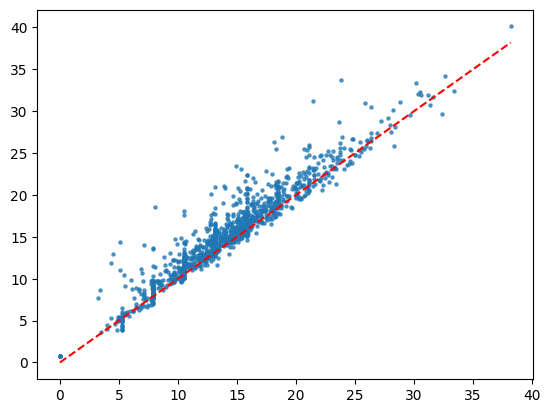

In [8]:
# plt.hist(metrics_df['radius_p50_pc'].dropna(), bins=40)
# plt.hist(metrics_df['radius_areaeq_pc'].dropna(), bins=40)
plt.scatter(metrics_df['radius_p50_pc'], metrics_df['radius_areaeq_pc'], alpha=0.7, s = 5)
#plot 1-1 line
plt.plot([0, metrics_df['radius_p50_pc'].max()], [0, metrics_df['radius_p50_pc'].max()], 'r--')

In [9]:
"""
Writes the final boundary label map to a FITS file.
"""
fits.PrimaryHDU(boundary_label.astype(np.float32)).writeto(boundary_fits, overwrite=True)
print(f"[done] Wrote boundary label map: {boundary_fits}")

[done] Wrote boundary label map: Boundary_maps/Boundary_map_100pc/Boundary_map_NW.fits


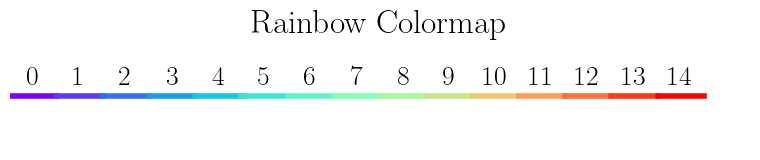

In [52]:
#make a list of 15 evenly spaced colours from the rainbow cmap to be used in all plots
cmap = plt.get_cmap('rainbow')
colors = [cmap(i) for i in np.linspace(0, 1, 15)]
#show the colours
plt.figure(figsize=(8, 2))
for i, color in enumerate(colors):
    plt.plot([i, i + 1], [0, 0], color=color, lw=4)
#label each colour with its index
for i in range(len(colors)):
    plt.text(i + 0.5, 0.1, str(i), ha='center', va='bottom')
plt.xlim(0, len(colors) + 1)
plt.ylim(-1, 1)
plt.axis('off')
plt.title('Rainbow Colormap')
plt.tight_layout()

In [127]:
def visualize_boundary_for_region(
    region_id,
    region_diagnostics,
    boundary_label,
    zoi_label,
    plots_dir="Boundary_map_plots",
    pixel_scale_pc=1.3,          # SITELLE on M33 ~ 1.3 pc/pixel
    radii_info=None,             # list like [(r_pc, r"$r_{50}$ = 18.5 pc"), ...]
    amplitude_units="",   
    ray_cmap="Purples",  
    for_paper=False  
):
    """
    Diagnostic plotting for one region: shows the cutout with rays and overlays
    ZOI and final boundary contours plus ray profiles.
    """
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.cm as cm

    # Try to use skimage for boundary outlines; if unavailable, skip contours
    try:
        from skimage.segmentation import find_boundaries
        have_skimage = True
    except Exception:
        have_skimage = False

    if radii_info is None:
        radii_info = []

    reg = region_diagnostics.get(region_id, None)
    if reg is None:
        raise ValueError(f"Region {region_id} not found in diagnostics.")

    sub = reg["sub"]
    cx_l, cy_l = reg["cx_l"], reg["cy_l"]
    x0, y0 = reg["x0"], reg["y0"]
    thetas = reg["thetas"]
    r_profiles = reg["r_profiles"]
    r_edges_raw = reg["r_edges_raw"]   # pixels
    region_label = int(reg.get("region_label", 0))
    bg = float(reg.get("bg", np.nan))

    # Log-scaled image for display
    finite = sub[np.isfinite(sub)]
    floor = np.nanpercentile(finite, 0.1) if finite.size else 1e-30
    log_sub = np.log10(np.maximum(sub, floor))

    # Fixed display range as requested
    vmin, vmax = -18, -15

    # Slice local masks
    zsub = (
        zoi_label[y0:y0 + sub.shape[0], x0:x0 + sub.shape[1]] == region_label
        if region_label > 0 else None
    )
    bsub = (
        boundary_label[y0:y0 + sub.shape[0], x0:x0 + sub.shape[1]] == region_label
        if region_label > 0 else None
    )

    if have_skimage and zsub is not None and np.any(zsub):
        z_edges = find_boundaries(zsub, mode="outer")
    else:
        z_edges = None

    if have_skimage and bsub is not None and np.any(bsub):
        b_edges = find_boundaries(bsub, mode="outer")
    else:
        b_edges = None

    fig, (ax_prof, ax_img) = plt.subplots(
        1, 2,
        figsize=(18, 6),
        gridspec_kw={"width_ratios": [1.5, 1]},
        constrained_layout=True,
    )

    # -------------------------
    # Left: image + rays
    # -------------------------
    ax_img.imshow(log_sub, origin="lower", cmap="rainbow", vmin=vmin, vmax=vmax)
    ax_img.scatter([cx_l], [cy_l], color="red", marker="+", s=60, zorder=5)

    # Greyscale colors for rays
    ray_cmap = cm.get_cmap(ray_cmap, len(thetas) + 2)

    # Ray length: extend to the farthest point in the ZoI
    if zsub is not None and np.any(zsub):
        yy, xx = np.where(zsub)
        rr_zoi = np.sqrt((xx - cx_l)**2 + (yy - cy_l)**2)
        rmax_ray_pix = np.nanmax(rr_zoi) if rr_zoi.size else 0.0
    else:
        rmax_ray_pix = np.nanmax(r_edges_raw[np.isfinite(r_edges_raw)]) if np.isfinite(r_edges_raw).any() else 0.0

    rmax_ray_pix = max(rmax_ray_pix, 1.0)

    for i, th in enumerate(thetas):
        color = ray_cmap(i + 1)  # avoid pure white / pure black extremes
        rr = np.linspace(0, rmax_ray_pix, 300)
        x_ray = cx_l + rr * np.cos(th)
        y_ray = cy_l + rr * np.sin(th)

        ax_img.plot(
            x_ray, y_ray,
            color=color,
            lw=0.8,
            alpha=0.5,
            zorder=3,
        )

        if np.isfinite(r_edges_raw[i]):
            ax_img.scatter(
                cx_l + r_edges_raw[i] * np.cos(th),
                cy_l + r_edges_raw[i] * np.sin(th),
                s=14,
                color=color,
                edgecolor="none",
                alpha=0.8,
                zorder=4,
            )

    # Contours
    if z_edges is not None:
        ax_img.contour(
            z_edges,
            levels=[0.5],
            colors="white",
            linewidths=1.2,
            origin="lower",
        )

    # if b_edges is not None:
    #     ax_img.contour(
    #         b_edges,
    #         levels=[0.5],
    #         colors="navy",
    #         linewidths=1.5,
    #         linestyles="--",
    #         origin="lower",
    #     )

    ax_img.set_aspect("equal")
    ax_img.set_xticks([])
    ax_img.set_yticks([])

    # Region ID text in top-left of left panel
    ax_img.text(
        0.03, 0.97,
        f"Region {region_id}",
        transform=ax_img.transAxes,
        ha="left",
        va="top",
        fontsize=15,
        bbox=dict(
            boxstyle="round,pad=0.3",
            facecolor="white",
            alpha=0.9,
            edgecolor="none",
        ),
        zorder=10,
    )

    # -------------------------
    # Right: radial profiles
    # -------------------------
    rmax_profile_pix = np.nanmax(r_edges_raw[np.isfinite(r_edges_raw)]) if np.isfinite(r_edges_raw).any() else 0.0
    rmax_profile_pix = max(rmax_profile_pix, 1.0)

    for i, th in enumerate(thetas):
        color = ray_cmap(i + 1)
        r_pix, prof_s = r_profiles[i]
        r_pc = np.asarray(r_pix) * pixel_scale_pc

        ax_prof.plot(
            r_pc,
            prof_s,
            color=color,
            lw=1.0,
            alpha=0.5,
        )

        if np.isfinite(r_edges_raw[i]):
            edge_pc = r_edges_raw[i] * pixel_scale_pc
            ax_prof.scatter(
                edge_pc,
                np.interp(r_edges_raw[i], r_pix, prof_s),
                color=color,
                s=15,
                alpha=0.8,
                zorder=3,
            )

    ax_prof.set_xlabel("Radius [pc]")

    if amplitude_units:
        ax_prof.set_ylabel(r"H$\alpha$ + [O III] amplitude" + f" [{amplitude_units}]")
    else:
        ax_prof.set_ylabel(r"H$\alpha$ + [O III] amplitude")

    ax_prof.grid(True, ls=":", alpha=0.3)
    ax_prof.set_xlim(0, max(10 * pixel_scale_pc, rmax_profile_pix * 1.05 * pixel_scale_pc))

    # Background line
    ax_prof.axhline(
        bg,
        ls="--",
        lw=1.0,
        alpha=0.6,
        color="gray",
    )
    
    # Tick styling
    ax_prof.minorticks_on()
    ax_prof.tick_params(
        axis='both', which='major',
        direction='in', length=7, width=1.5,
        labelsize=16, top=True, right=True
    )
    ax_prof.tick_params(
        axis='both', which='minor',
        direction='in', length=4, width=1.2,
        top=True, right=True
    )

    # Vertical radius markers + legend with rainbow colors
    legend_handles = []
    legend_labels = []

    if radii_info:
        
        color_list = [colors[0], colors[4], colors[8], colors[12]]
        for i, (rad_pc, label) in enumerate(radii_info):
            color = color_list[i]

            line = ax_prof.axvline(
                rad_pc,
                ls="--",
                lw=1.5,
                alpha=0.9,
                color=color,
            )

            legend_handles.append(line)
            legend_labels.append(label)

    if legend_handles:
        ax_prof.legend(
            legend_handles,
            legend_labels,
            loc="upper right",
            frameon=True,
            facecolor="white", edgecolor="black", framealpha=1.0
            
        )

    os.makedirs(plots_dir, exist_ok=True)
    if for_paper:
        outname = os.path.join('PAPER_PLOTS', f"Region_{region_id}_boundary_viz_{FIELD}.png")
    else:
        outname = os.path.join(plots_dir, f"Region_{region_id}_boundary_viz.png")
    plt.savefig(outname, dpi=150, bbox_inches="tight")
    plt.show()

    return outname

In [128]:
region_diagnostics.keys()

dict_keys(['NW_0001', 'NW_0002', 'NW_0003', 'NW_0004', 'NW_0005', 'NW_0006', 'NW_0007', 'NW_0008', 'NW_0009', 'NW_0010', 'NW_0011', 'NW_0012', 'NW_0013', 'NW_0014', 'NW_0015', 'NW_0016', 'NW_0017', 'NW_0018', 'NW_0019', 'NW_0020', 'NW_0021', 'NW_0022', 'NW_0023', 'NW_0024', 'NW_0025', 'NW_0026', 'NW_0027', 'NW_0028', 'NW_0029', 'NW_0030', 'NW_0031', 'NW_0032', 'NW_0033', 'NW_0034', 'NW_0035', 'NW_0036', 'NW_0037', 'NW_0038', 'NW_0039', 'NW_0040', 'NW_0041', 'NW_0042', 'NW_0043', 'NW_0044', 'NW_0045', 'NW_0046', 'NW_0047', 'NW_0048', 'NW_0049', 'NW_0050', 'NW_0051', 'NW_0052', 'NW_0053', 'NW_0054', 'NW_0055', 'NW_0056', 'NW_0057', 'NW_0058', 'NW_0059', 'NW_0060', 'NW_0061', 'NW_0062', 'NW_0063', 'NW_0064', 'NW_0065', 'NW_0066', 'NW_0067', 'NW_0068', 'NW_0069', 'NW_0070', 'NW_0071', 'NW_0072', 'NW_0073', 'NW_0074', 'NW_0075', 'NW_0076', 'NW_0077', 'NW_0078', 'NW_0079', 'NW_0080', 'NW_0081', 'NW_0082', 'NW_0083', 'NW_0084', 'NW_0085', 'NW_0086', 'NW_0087', 'NW_0088', 'NW_0089', 'NW_0090',

R16: 13.87 pc, R50: 16.55 pc, R84: 23.78 pc, R_areaeq: 18.91 pc
13.87309775234243


/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_1229/2413858102.py:48: RuntimeWarning: invalid value encountered in log10
  log_sub = np.log10(np.maximum(sub, floor))
/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_1229/2413858102.py:87: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  ray_cmap = cm.get_cmap(ray_cmap, len(thetas) + 2)


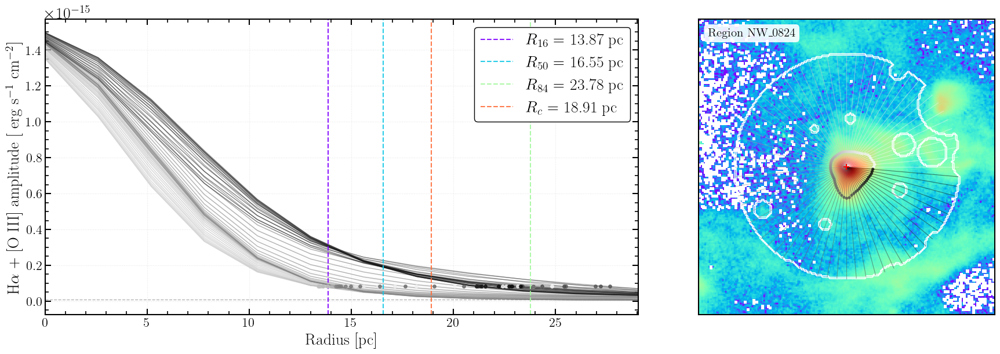

[done] Saved 1 diagnostic plots to: plots/boundary_plots/


In [130]:
"""
Runs diagnostic plots for all regions
"""
make_plots = True

r_to_plot = ['NW_0824']


r16 = metrics_df.set_index('region_id').loc[r_to_plot, 'radius_p16_pc']
r50 = metrics_df.set_index('region_id').loc[r_to_plot, 'radius_p50_pc']
r84 = metrics_df.set_index('region_id').loc[r_to_plot, 'radius_p84_pc']
r_areaeq = metrics_df.set_index('region_id').loc[r_to_plot, 'radius_areaeq_pc']
print(f"R16: {r16.values[0]:.2f} pc, R50: {r50.values[0]:.2f} pc, R84: {r84.values[0]:.2f} pc, R_areaeq: {r_areaeq.values[0]:.2f} pc")
print(r16.iloc[0])
if make_plots:
    saved = []
    for rid in r_to_plot:
        try:
            out = visualize_boundary_for_region(
                rid,
                region_diagnostics,
                boundary_label=boundary_label,
                zoi_label=zoi_label,
                plots_dir=plots_dir,
                pixel_scale_pc=1.3,
                radii_info=[
                    (r16.iloc[0], f"$R_{{16}}$ = {r16.iloc[0]:.2f} pc"),
                    (r50.iloc[0], f"$R_{{50}}$ = {r50.iloc[0]:.2f} pc"),
                    (r84.iloc[0], f"$R_{{84}}$ = {r84.iloc[0]:.2f} pc"),
                    (r_areaeq.iloc[0], f"$R_{{c}}$ = {r_areaeq.iloc[0]:.2f} pc"),
                ],  
            amplitude_units=" erg s$^{{-1}}$ cm$^{{-2}}$",
            ray_cmap="Greys",
                for_paper=True,
                    )
            saved.append(out)
        except Exception as e:
            print(f"[warn] Plot failed for {rid}: {e}")

    print(f"[done] Saved {len(saved)} diagnostic plots to: {plots_dir}")

In [ ]:

def make_contours_legacy(zoi_labels, filep='ContZoI_map'):
    """
    Matches your original: XOR with a 1-pixel erosion (square footprint),
    return NaN background with 1 on edges; also saves FITS.
    """
    h, w = zoi_labels.shape
    outfile = np.zeros((h, w), dtype=float)

    for ipeak in range(len(np.unique(zoi_labels))):
        L = float(ipeak + 1)
        cy, cx = np.where(zoi_labels == L)
        if cy.size == 0:
            continue

        y0, y1 = max(cy.min()-1, 0), min(cy.max()+2, h)
        x0, x1 = max(cx.min()-1, 0), min(cx.max()+2, w)

        reg = np.copy(zoi_labels[y0:y1, x0:x1])
        reg[reg != L] = 0.0
        mask = (reg == L)

        # edge by XOR with erosion (square 3x3, like your original)
        edge = np.logical_xor(mask, ndimage.binary_erosion(mask))
        cont = np.zeros_like(reg, dtype=float)
        cont[edge] = L + 1.0  # any nonzero marker

        # accumulate 
        outfile[y0:y1, x0:x1] = np.where(cont > 0, 1.0, outfile[y0:y1, x0:x1])

    outfile[outfile == 0] = np.nan

    cont_fits_path = f"{BOUND_DIR}/{filep}_{FIELD}.fits"
    if header_info is not None:
        fits.writeto(cont_fits_path, outfile, header_info, overwrite=True)
    else:
        fits.writeto(cont_fits_path, outfile, overwrite=True)
    print('   Saved boundary contours:', cont_fits_path)

    return outfile

cont_map = make_contours_legacy(boundary_label, filep='ContDomain_map')


   Saved boundary contours: Boundary_maps/Boundary_map_100pc/ContDomain_map_SW.fits


In [ ]:
np.nanmax(boundary_label)

1093.0

In [ ]:
def plot_field_overlay_halpha_peaks_zoi_boundaries(
    catalog_df,
    ha_fits_path,
    zoi_label_map,
    boundary_label_map,
    field_name=None,
    x_col="x",
    y_col="y",
    region_label_col="zoi_center_label",
    region_id_col="region_id",
    xlim=None,
    ylim=None,
    show_peaks=True,
    show_zoi=True,
    show_boundaries=True,
    peaks_kwargs=None,
    zoi_color="cyan",
    boundary_color="magenta",
    zoi_lw=0.8,
    boundary_lw=1.1,
    alpha_zoi=0.65,
    alpha_boundary=0.9,
    # NEW: LogNorm controls
    ha_percentiles=(5, 99),         # global vmin/vmax percentiles (positive pixels only)
    use_local_lognorm=False,        # if True and xlim/ylim provided -> compute per-view norm
    local_percentiles=(3.0, 99.7),  # per-view percentiles (positive pixels only)
    min_pos_pixels=20,              # minimum positive pixels required to trust local percentiles
    eps_pos=None,                   # epsilon floor for vmin (defaults to nextafter(0,1))
    savepath=None,
):
    """
    Overplot peaks + ZOI outlines + boundary outlines on the Halpha map, using LogNorm scaling.

    Parameters
    ----------
    catalog_df : pandas.DataFrame
        Must include x_col/y_col; should include region_label_col (integer ZOI label at center).
    ha_fits_path : str
        Path to Halpha FITS.
    zoi_label_map : 2D array
        Integer-labeled ZOI map (0 outside).
    boundary_label_map : 2D array
        Integer-labeled boundary map (0 outside).
    field_name : str
        Optional display name.
    xlim, ylim : (min,max) or None
        Plot limits in pixel coordinates.
    ha_percentiles : (lo, hi)
        Percentiles used for global LogNorm vmin/vmax (positive finite pixels only).
    use_local_lognorm : bool
        If True and xlim/ylim are given, compute per-view LogNorm using local_percentiles,
        falling back to global if too few positive pixels.
    """

    import numpy as np
    import matplotlib.pyplot as plt
    from astropy.io import fits
    from matplotlib.colors import LogNorm

    # Lazy import so this cell works even if skimage isn't installed elsewhere
    try:
        from skimage.segmentation import find_boundaries  # noqa: F401  (kept as in your original)
    except Exception as e:
        raise ImportError(
            "This plotting function requires scikit-image. "
            "Install with: pip install scikit-image"
        ) from e

    if eps_pos is None:
        eps_pos = np.nextafter(0, 1)

    # --- Field name ---
    if field_name is None:
        field_name = (
            str(catalog_df.get("field", ["Field"]).iloc[0])
            if hasattr(catalog_df, "iloc")
            else "Field"
        )

    # --- Load Halpha map ---
    ha = fits.getdata(ha_fits_path)
    ha = np.where(np.isfinite(ha), ha, np.nan)

    # --- Compute GLOBAL LogNorm vmin/vmax from positive finite pixels ---
    valid_pos = ha[np.isfinite(ha) & (ha > 0)]
    if valid_pos.size == 0:
        raise ValueError("Hα map has no positive finite values for LogNorm.")

    vmin_global = np.nanpercentile(valid_pos, ha_percentiles[0])
    vmax_global = np.nanpercentile(valid_pos, ha_percentiles[1])

    # Fallback if percentiles are degenerate
    if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
        vmin_global, vmax_global = np.nanmin(valid_pos), np.nanmax(valid_pos)
        if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
            raise ValueError("Failed to compute valid global vmin/vmax for Hα.")

    vmin_global = max(vmin_global, eps_pos)

    def _local_lognorm(arr2d):
        """Compute a per-view LogNorm using positive finite pixels, fallback to global."""
        pos = arr2d[np.isfinite(arr2d) & (arr2d > 0)]
        vmin_loc, vmax_loc = vmin_global, vmax_global

        if pos.size >= min_pos_pixels:
            lo = np.nanpercentile(pos, local_percentiles[0])
            hi = np.nanpercentile(pos, local_percentiles[1])
            if np.isfinite(lo) and np.isfinite(hi) and hi > lo:
                vmin_loc, vmax_loc = lo, hi

        vmin_loc = max(vmin_loc, eps_pos)
        if (not np.isfinite(vmax_loc)) or (vmax_loc <= vmin_loc):
            vmax_loc = vmin_loc * 1.01
        return LogNorm(vmin=vmin_loc, vmax=vmax_loc)

    # Decide norm: global or local-per-view
    norm = LogNorm(vmin=vmin_global, vmax=vmax_global)
    if use_local_lognorm and (xlim is not None) and (ylim is not None):
        # Clip indices safely and compute norm on that view
        x0, x1 = sorted([int(np.floor(xlim[0])), int(np.ceil(xlim[1]))])
        y0, y1 = sorted([int(np.floor(ylim[0])), int(np.ceil(ylim[1]))])
        x0 = max(0, x0); y0 = max(0, y0)
        x1 = min(ha.shape[1], x1); y1 = min(ha.shape[0], y1)
        view = ha[y0:y1, x0:x1]
        if view.size > 0:
            norm = _local_lognorm(view)

    # --- Ensure integer maps ---
    zoi_int = np.rint(np.nan_to_num(zoi_label_map, nan=0)).astype(np.int32)
    bnd_int = np.rint(np.nan_to_num(boundary_label_map, nan=0)).astype(np.int32)

    # --- Figure ---
    fig, ax = plt.subplots(figsize=(10, 10 * ha.shape[0] / ha.shape[1]))

    # Make NaNs white
    cmap_gray = plt.get_cmap("gray").copy()
    cmap_gray.set_bad(color="white")

    # IMPORTANT CHANGE: show ha (linear) with LogNorm (not log10(ha))
    im = ax.imshow(ha, origin="lower", cmap=cmap_gray, norm=norm)

    # --- Overlay outlines ---
    labels_from_catalog = None
    if hasattr(catalog_df, "columns") and (region_label_col in catalog_df.columns):
        labels_from_catalog = sorted({
            int(v) for v in catalog_df[region_label_col].values
            if np.isfinite(v) and int(v) > 0
        })

    if labels_from_catalog and len(labels_from_catalog) > 0:
        labels = labels_from_catalog
    else:
        labels = sorted([int(v) for v in np.unique(bnd_int) if v > 0])

    # NOTE: your original code contours the entire label maps at 0.5, which is fine.
    if show_zoi and np.isfinite(zoi_int).any():
        edge = np.nan_to_num(zoi_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[zoi_color], linewidths=zoi_lw,
                   origin="lower", zorder=1, alpha=alpha_zoi)
    if show_boundaries and np.isfinite(bnd_int).any():
        edge = np.nan_to_num(bnd_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[boundary_color], linewidths=boundary_lw,
                   origin="lower", zorder=1, alpha=alpha_boundary)

    # --- Plot peak centers ---
    if show_peaks:
        if peaks_kwargs is None:
            peaks_kwargs = dict(marker="+", s=18, linewidths=0.8, alpha=0.85)
        xs = catalog_df[x_col].astype(float).values
        ys = catalog_df[y_col].astype(float).values
        ax.scatter(xs, ys, color="k", **peaks_kwargs, label="Peaks")

    # --- Colorbar ---
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(r"H$\alpha$ flux (LogNorm)")

    # --- Aesthetics ---
    ax.set_title(f"{field_name}: Halpha with Peaks, ZOI (cyan), Boundaries (magenta)")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_facecolor("white")
    fig.patch.set_facecolor("white")

    # Limits
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)

    if show_peaks:
        ax.legend(loc="upper right", frameon=True)

    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, bbox_inches="tight", dpi=300, facecolor="white")
        print(f"[done] Saved overlay plot: {savepath}")

    plt.show()
    return fig, ax

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_SW_overlay_peaks_zoi_boundaries.png
[done] Saved overlay plot: plots/boundary_plots//M33_SW_overlay_peaks_zoi_boundaries.png


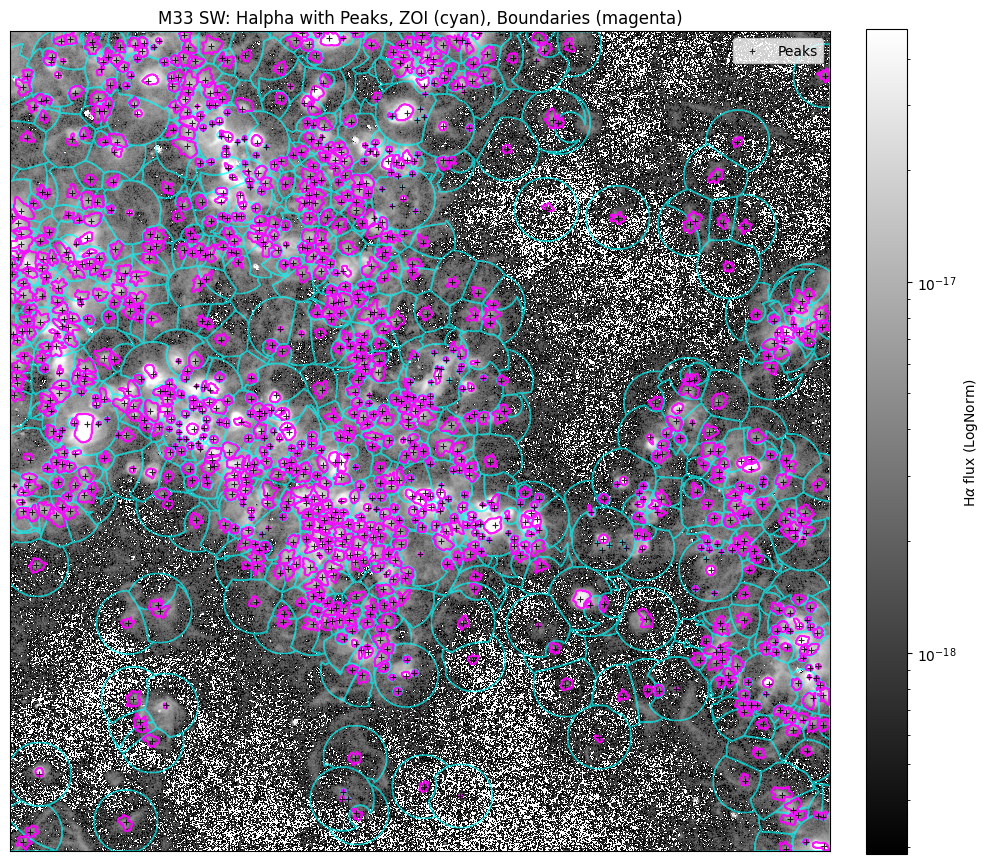

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_SW_overlay_peaks_zoi.png
[done] Saved overlay plot: plots/boundary_plots//M33_SW_overlay_peaks_zoi.png


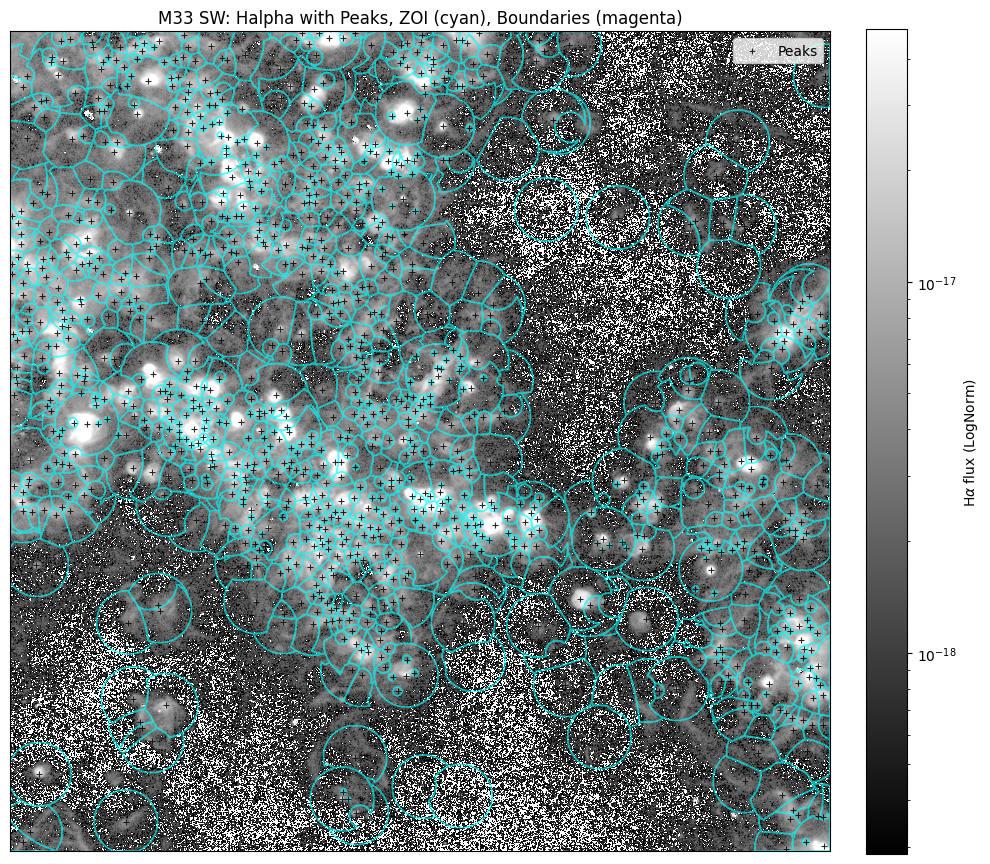

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_SW_overlay_peaks_boundaries.png
[done] Saved overlay plot: plots/boundary_plots//M33_SW_overlay_peaks_boundaries.png


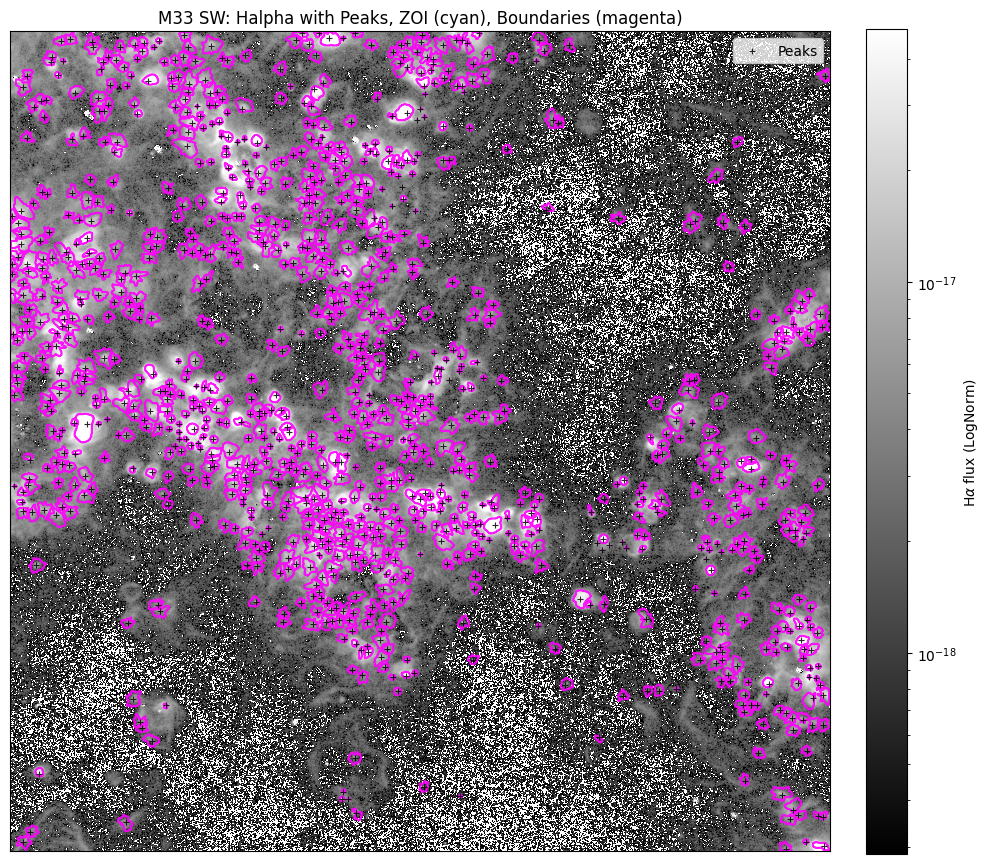

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_SW_overlay_peaks.png
[done] Saved overlay plot: plots/boundary_plots//M33_SW_overlay_peaks.png


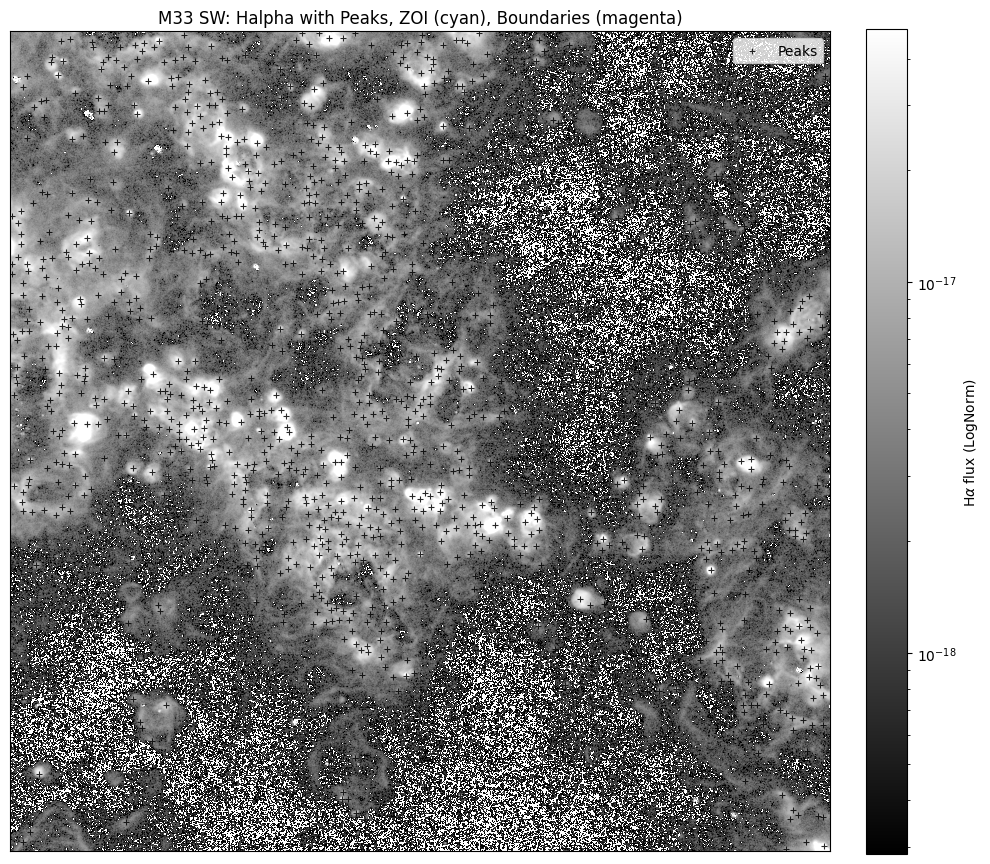

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_SW_overlay__zoi_boundaries.png
[done] Saved overlay plot: plots/boundary_plots//M33_SW_overlay__zoi_boundaries.png


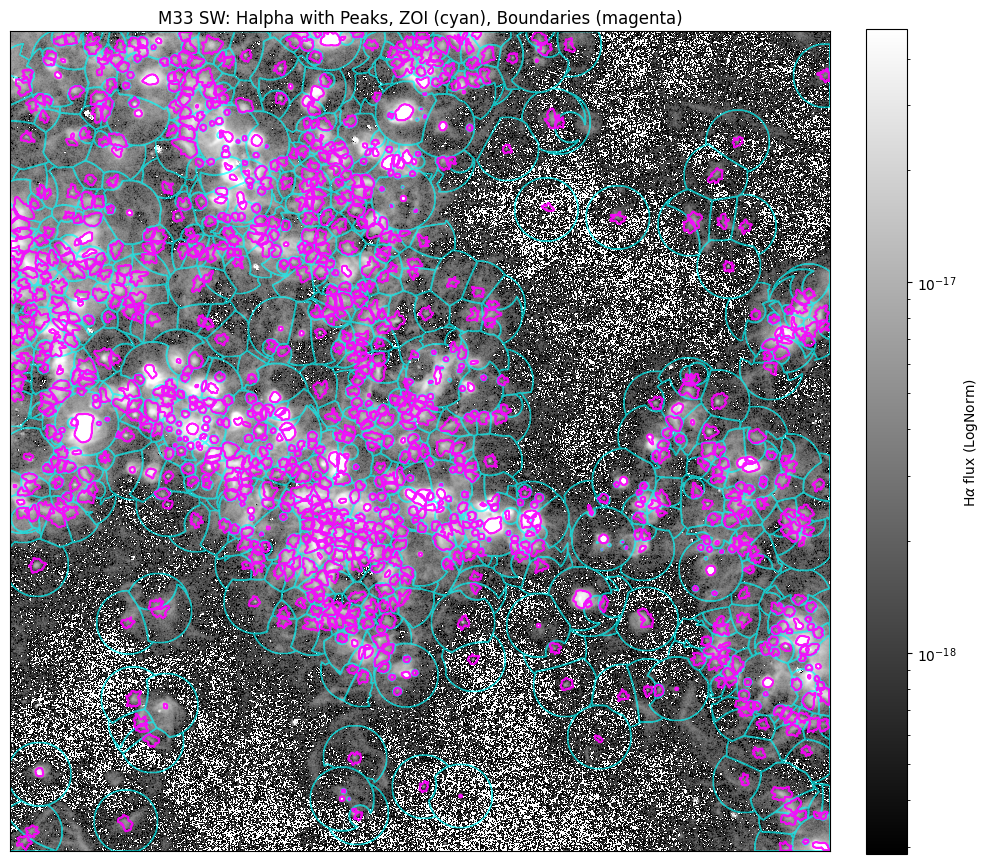

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_SW_overlay__zoi.png
[done] Saved overlay plot: plots/boundary_plots//M33_SW_overlay__zoi.png


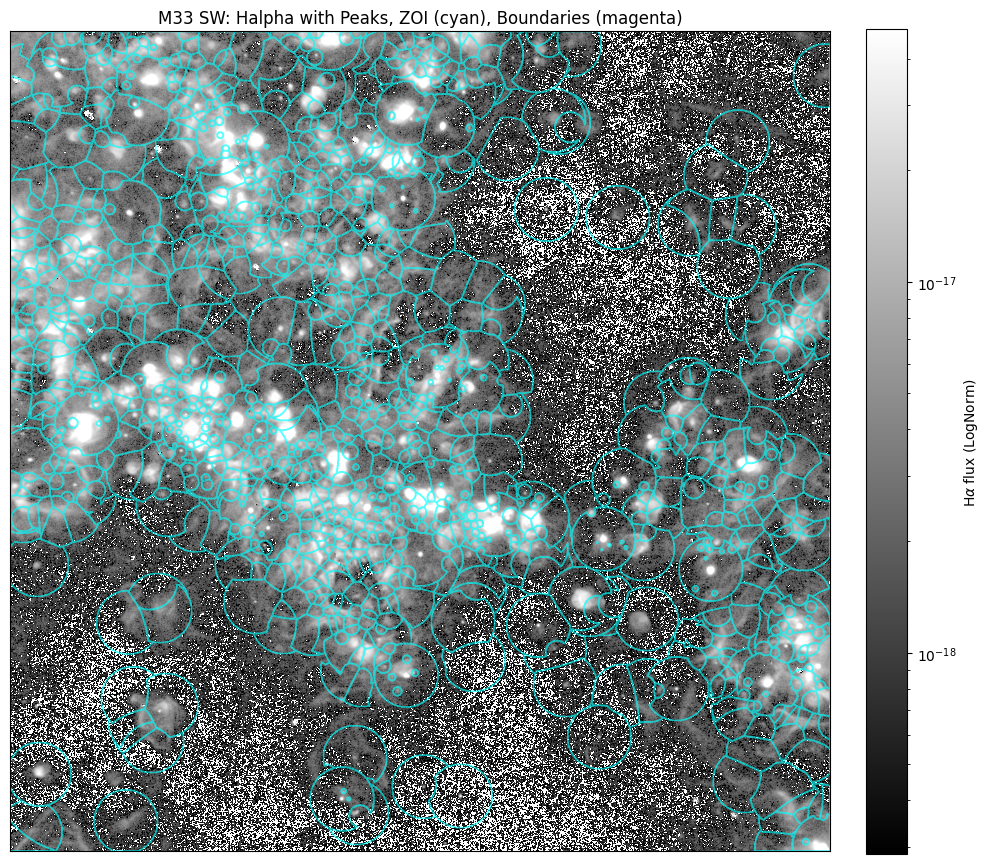

Creating overlay plot with peaks, ZOI, and boundaries; saving to: plots/boundary_plots//M33_SW_overlay__boundaries.png
[done] Saved overlay plot: plots/boundary_plots//M33_SW_overlay__boundaries.png


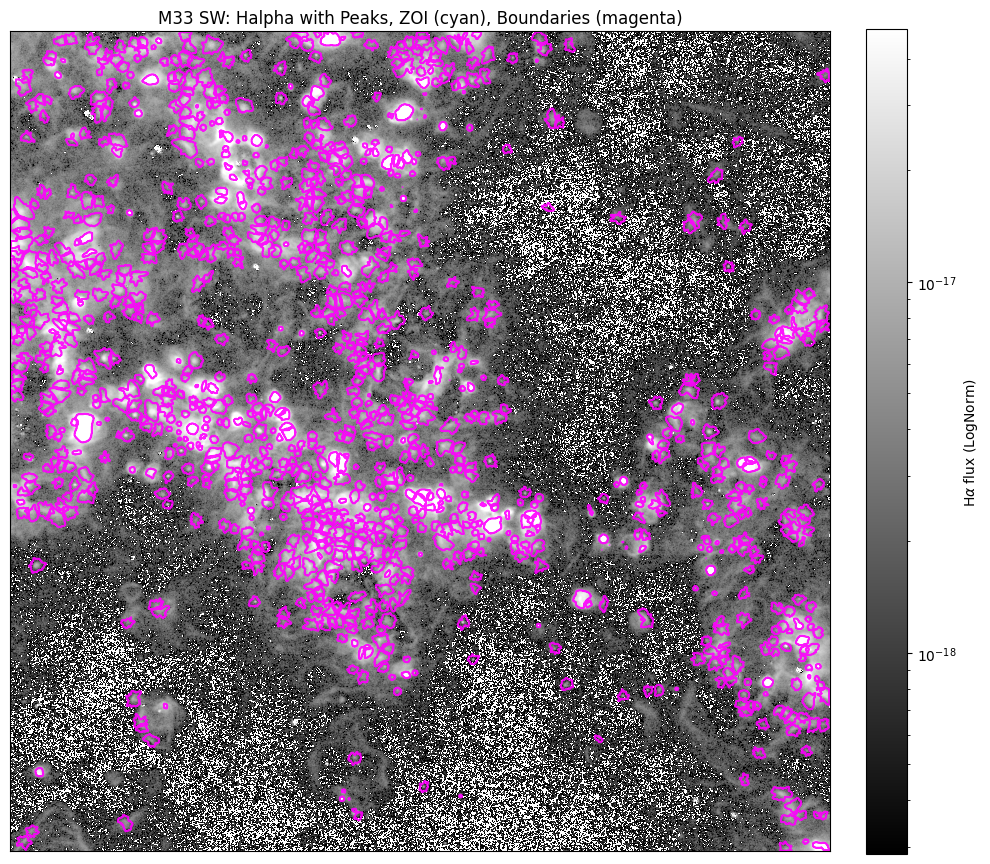

In [ ]:
"""
Runs the full-field overlay plot using the variables created earlier in the notebook.
"""
# Example usage (matches your earlier variables):
# - combined: your peak catalog dataframe
# - halpha_fits: Halpha FITS path
# - zoi_label: ZOI label map (2D)
# - boundary_label: final boundary label map (2D)

# Optional: zoom limits (set to None to show full frame)
xlim = (50, 2000)
ylim = (50, 2000)

#plot all variations wih only peaks, zoi, boundaries and then all together
for show_peaks in [True, False]:
    for show_zoi in [True, False]:
        for show_boundaries in [True, False]:
            if not (show_peaks or show_zoi or show_boundaries):
                continue  # skip empty plot
            plot_overlay_path = f"{plots_dir}/M33_{FIELD}_overlay_{'peaks' if show_peaks else ''}{'_zoi' if show_zoi else ''}{'_boundaries' if show_boundaries else ''}.png"
            print(f"Creating overlay plot with peaks, ZOI, and boundaries; saving to: {plot_overlay_path}")
            plot_field_overlay_halpha_peaks_zoi_boundaries(
                catalog_df=combined,
                ha_fits_path=halpha_fits,
                zoi_label_map=contzoi_label,
                boundary_label_map=cont_map,
                field_name=f"M33 {FIELD}",
                x_col="x",
                y_col="y",
                region_label_col="zoi_center_label",
                xlim=xlim,
                ylim=ylim,
                show_peaks=show_peaks,
                show_zoi=show_zoi,
                show_boundaries=show_boundaries,
                savepath=plot_overlay_path,
            )